# Text to image generation with CUB200 trained DALLE

In [1]:
import torch
print(torch.__version__)

/home/mprabhud/miniconda3/envs/vlr_sp2/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1.13.1+cu117


In [2]:
import os
import sys
sys.path.insert(0,"/home/mprabhud/phd_projects/digen/taming-transformers/")
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import torch
import torch.nn.functional as F
from torchvision.utils import make_grid
from dalle_pytorch import VQGanVAE, DALLE
from tokenizers import Tokenizer

%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from PIL import Image
import numpy as np
# import clip

def show(img):
    npimg = img.numpy()
    plt.figure(figsize = (100,40))
    plt.imshow(np.transpose(npimg, (1,2,0)), interpolation='nearest')

### Prepare VQGAN and BPE

In [7]:
DATA = "cub" # Change here to "cub" or "coco"

if DATA == "cub":
    BPE_path = "cub200_bpe_vsize_7800.json"
    dalle_path = "cub200_adam.pth"
# elif DATA == "coco":
#     BPE_path = "BPE/coco_bpe_vsize_15000.json"
#     dalle_path = "pretrained/coco_adam.pth"

vae_dict = {"args": {"image_size": 256, "emb_dim": 256}}
vae = VQGanVAE()

vocab = Tokenizer.from_file(BPE_path)

Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Loaded VQGAN from /home/mprabhud/.cache/dalle/vqgan.1024.model.ckpt and /home/mprabhud/.cache/dalle/vqgan.1024.config.yml


### Load pretrained DALLE model

In [8]:
# Prepare DALLE
dalle_dict = torch.load(dalle_path)
dalle_dict.keys()

dict_keys(['epoch', 'dalle', 'vae', 'optimizer', 'global_step', 'args'])

In [9]:
dalle_dict['args']

{'gpu': None,
 'data': '/home/shared/data_zoo/cub200/train',
 'data_name': 'cub200',
 'save_path': '/home/shared/model_zoo/training_logs_dalle/cub200.DALLE.bs110.adam.lr0.00045.wu0.p1.e1000.v7800.tl80.trained_bpe.amp0.agc0.sa1.full,sparse.re0.d8.h8.dh64.hr1.v7.0.vqgan.layernorm.no_gclip.loss_weight',
 'resume_path': None,
 'workers': 10,
 'batch_size': 110,
 'lr': 0.00045,
 'lr_plateau': True,
 'epochs': 1000,
 'use_amp': False,
 'optimizer': 'adam',
 'warmup_epoch': None,
 'vae_path': 'vqgan',
 'num_text_tokens': 7800,
 'text_seq_len': 80,
 'tokenizer': 'trained_bpe',
 'sparse_attn': True,
 'depth': 8,
 'heads': 8,
 'dim_heads': 64,
 'reversible': False,
 'attn_types': 'full,sparse',
 'agc': False,
 'horovod': True,
 'fp16_allreduce': True,
 'use_adasum': False,
 'gradient_predivide_factor': 1.0}

In [13]:
dalle_dict['dalle'].keys()

odict_keys(['logits_mask', 'text_emb.weight', 'image_emb.weight', 'text_pos_emb.weight', 'image_pos_emb.weights_0', 'image_pos_emb.weights_1', 'vae.model.encoder.conv_in.weight', 'vae.model.encoder.conv_in.bias', 'vae.model.encoder.down.0.block.0.norm1.weight', 'vae.model.encoder.down.0.block.0.norm1.bias', 'vae.model.encoder.down.0.block.0.conv1.weight', 'vae.model.encoder.down.0.block.0.conv1.bias', 'vae.model.encoder.down.0.block.0.norm2.weight', 'vae.model.encoder.down.0.block.0.norm2.bias', 'vae.model.encoder.down.0.block.0.conv2.weight', 'vae.model.encoder.down.0.block.0.conv2.bias', 'vae.model.encoder.down.0.block.1.norm1.weight', 'vae.model.encoder.down.0.block.1.norm1.bias', 'vae.model.encoder.down.0.block.1.conv1.weight', 'vae.model.encoder.down.0.block.1.conv1.bias', 'vae.model.encoder.down.0.block.1.norm2.weight', 'vae.model.encoder.down.0.block.1.norm2.bias', 'vae.model.encoder.down.0.block.1.conv2.weight', 'vae.model.encoder.down.0.block.1.conv2.bias', 'vae.model.encoder.

In [17]:
# Reformat attention types
attn_types = []
for type in dalle_dict['args']['attn_types'].split(","):
    assert type in ("full", "sparse", "axial_row", "axial_col", "conv_like")
    attn_types.append(type)
attn_types = tuple(attn_types)
print("[Log] Attention types: ", attn_types)

dalle = DALLE(
        dim=vae_dict['args']['emb_dim'],
        vae=vae,
        num_text_tokens=dalle_dict['args']['num_text_tokens'],
        text_seq_len=dalle_dict['args']['text_seq_len'],
        depth=dalle_dict['args']['depth'],
        heads=dalle_dict['args']['heads'],
        reversible=dalle_dict['args']['reversible'],
        attn_types=attn_types,
).cuda()

dalle.load_state_dict(dalle_dict['dalle'], strict=False)


[Log] Attention types:  ('full', 'sparse')


RuntimeError: Error(s) in loading state_dict for DALLE:
	size mismatch for to_logits.1.weight: copying a param with shape torch.Size([8824, 256]) from checkpoint, the shape in current model is torch.Size([8904, 256]).
	size mismatch for to_logits.1.bias: copying a param with shape torch.Size([8824]) from checkpoint, the shape in current model is torch.Size([8904]).
	size mismatch for text_emb.weight: copying a param with shape torch.Size([7800, 256]) from checkpoint, the shape in current model is torch.Size([7880, 256]).

## Generate image from text

Using /root/.cache/torch_extensions as PyTorch extensions root...
Emitting ninja build file /root/.cache/torch_extensions/sparse_attn/build.ninja...
Building extension module sparse_attn...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
Loading extension module sparse_attn...
Time to load sparse_attn op: 0.4268310070037842 seconds


/opt/conda/envs/dalle/lib/python3.7/site-packages/deepspeed/ops/sparse_attention/matmul.py:272: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /opt/conda/conda-bld/pytorch_1607370141920/work/torch/csrc/utils/python_arg_parser.cpp:882.)
  nnz = layout.nonzero()


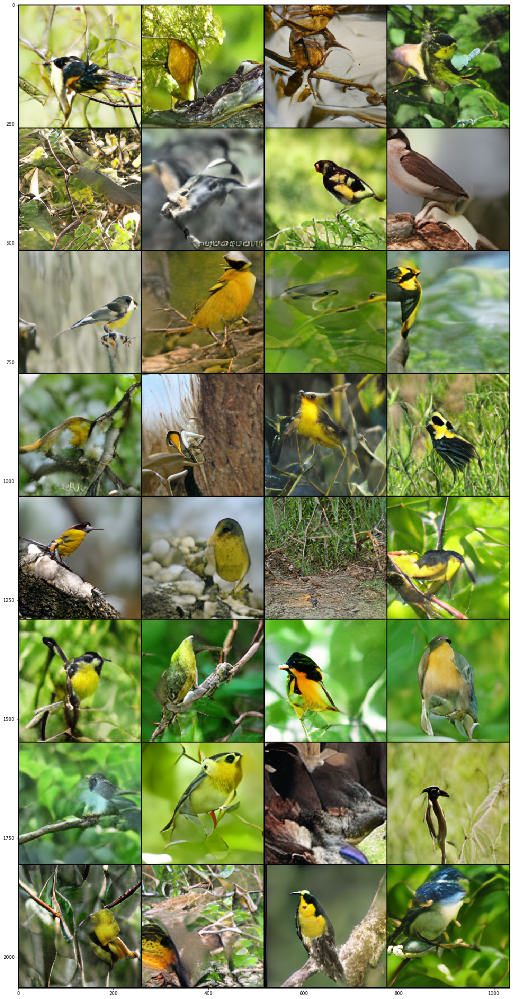

In [4]:
input_text = ["this colorful bird has a yellow breast , with a black crown and a black cheek patch"] * 32

token_list = []
sot_token = vocab.encode("<|startoftext|>").ids[0]
eot_token = vocab.encode("<|endoftext|>").ids[0]
for txt in input_text:
    codes = [0] * dalle_dict['args']['text_seq_len']
    text_token = vocab.encode(txt).ids
    tokens = [sot_token] + text_token + [eot_token]
    codes[:len(tokens)] = tokens
    caption_token = torch.LongTensor(codes).cuda()
    token_list.append(caption_token)
text = torch.stack(token_list)
mask = (text != 0).cuda()

images = dalle.generate_images(text, mask = mask, filter_thres = 0.9, temperature=1.0)

grid = make_grid(images, nrow=4, normalize=False, range=(-1, 1)).cpu()
show(grid)

## Clip reranking

### Prepare Pretrained CLIP model

In [5]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

### Get scores from CLIP

In [6]:
""" Get rank by CLIP! """
image = F.interpolate(images, size=224)
text = clip.tokenize(["this colorful bird has a yellow breast , with a black crown and a black cheek patch."]).to(device)

with torch.no_grad():
    image_features = model.encode_image(image)
    text_features = model.encode_text(text)

    logits_per_image, logits_per_text = model(image, text)
    probs = logits_per_text.softmax(dim=-1).cpu().numpy()

print("Label probs:", probs)

Label probs: [[3.0258e-02 1.3084e-03 2.5928e-05 1.3016e-02 1.3294e-03 1.1146e-05
  1.4429e-01 8.1873e-04 1.1730e-03 7.4890e-02 7.2122e-06 4.6143e-02
  2.0477e-02 4.0770e-05 4.4708e-02 2.4170e-01 5.3101e-02 1.2755e-04
  2.1915e-03 3.5370e-02 2.9327e-02 3.2196e-02 2.8870e-02 4.2664e-02
  4.9686e-04 1.6708e-02 2.4452e-03 1.0033e-03 9.9792e-03 1.1848e-02
  1.1243e-01 1.0519e-03]]


### Perform reranking

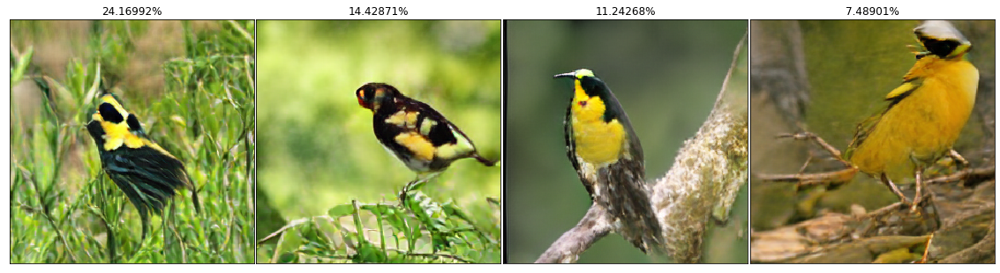

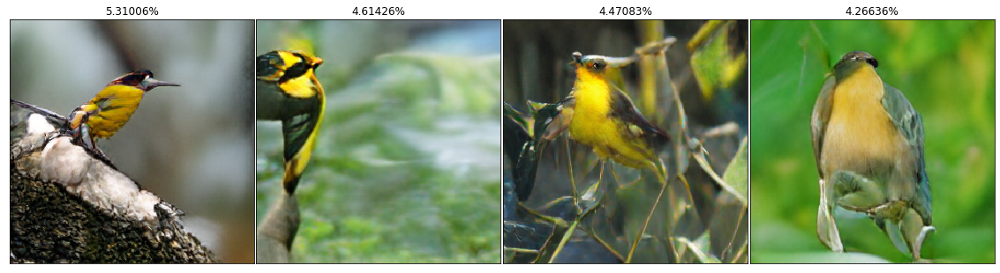

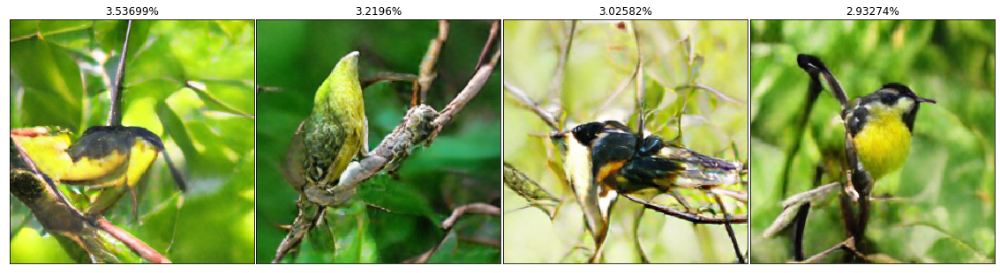

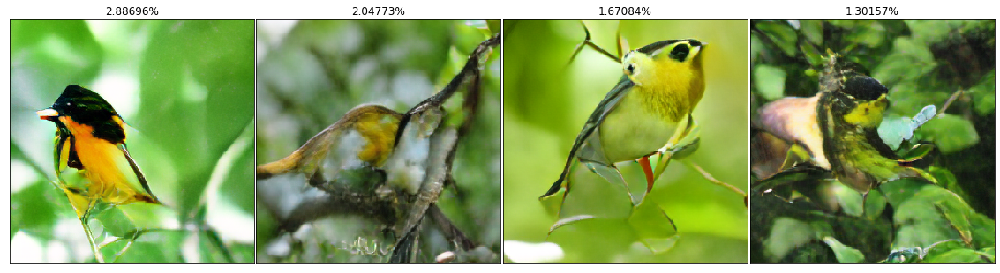

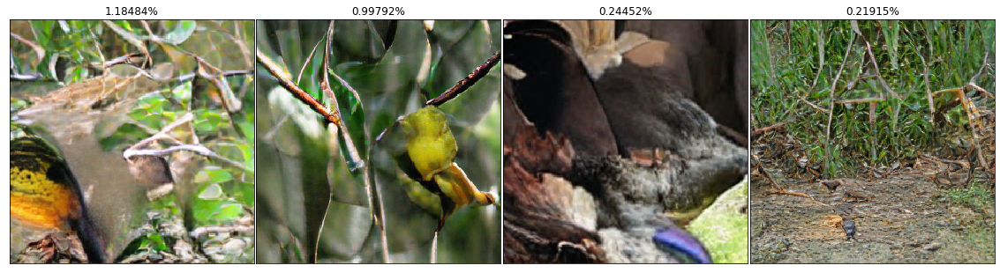

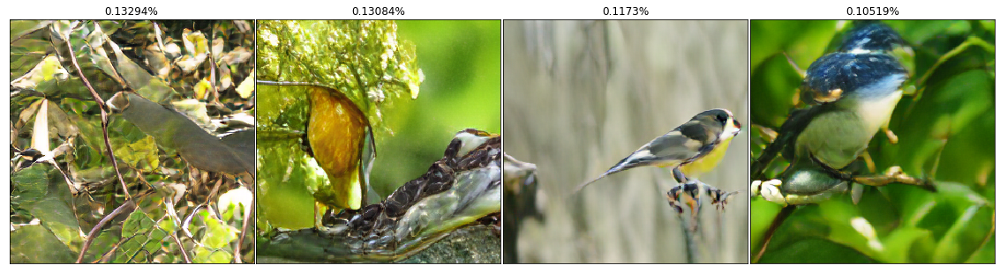

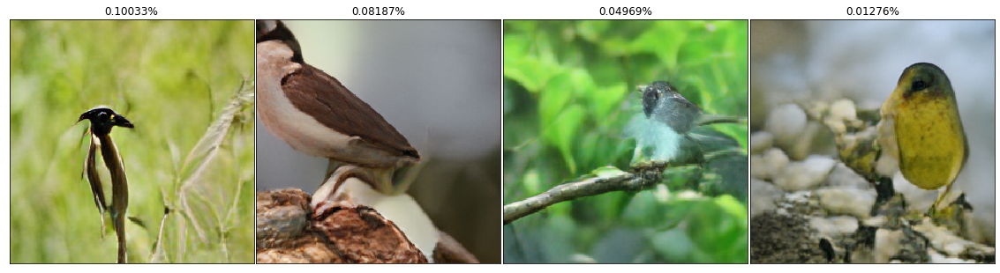

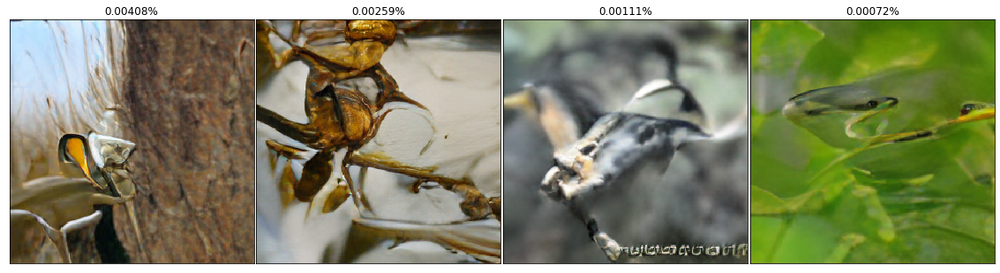

In [7]:
np_images = images.cpu().numpy()
scores = probs[0]

def show_reranking(images, scores, sort=True):
    img_shape = images.shape
    if sort:
        scores_sort = scores.argsort()
        scores = scores[scores_sort[::-1]]
        images = images[scores_sort[::-1]]

    rows = 4
    cols = img_shape[0] // 4
    img_idx = 0

    for col in range(cols):
        fig, axs = plt.subplots(1, rows, figsize=(20,20))
        plt.subplots_adjust(wspace=0.01)
        for row in range(rows):
            tran_img = np.transpose(images[img_idx], (1,2,0))
            axs[row].imshow(tran_img, interpolation='nearest')
            axs[row].set_title("{}%".format(np.around(scores[img_idx]*100, 5)))
            axs[row].set_xticks([])
            axs[row].set_yticks([])
            img_idx += 1

show_reranking(np_images, scores)

## To prime with a starting crop of an image

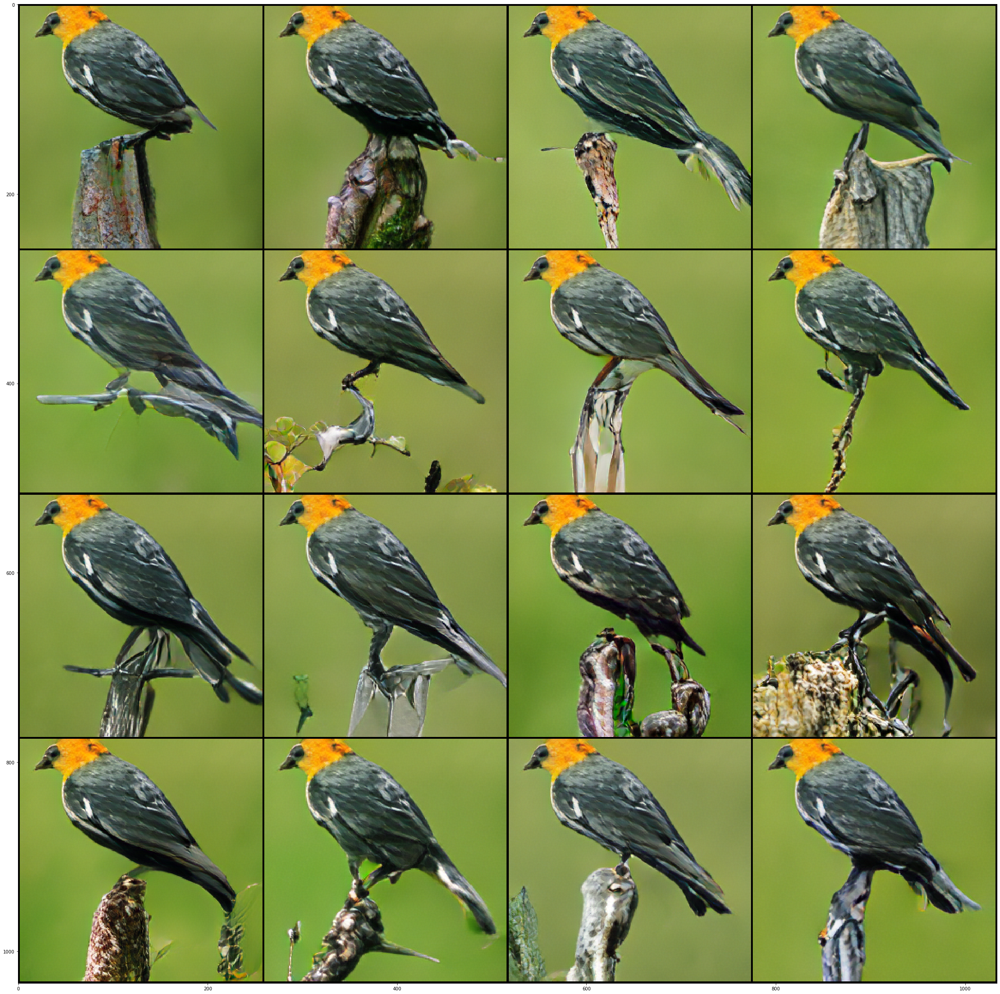

In [8]:
from torchvision import transforms

txt = "this bird has wings that are brown with a white belly"
img_path = "images/Yellow_Headed_Blackbird_0013_8362.jpg"

img = Image.open(img_path)
tf = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB") if img.mode != "RGB" else img),
    transforms.RandomResizedCrop(256, scale=(0.6, 1.0), ratio=(1.0, 1.0)),
    transforms.ToTensor(),
])
img = tf(img).cuda()

sot_token = vocab.encode("<|startoftext|>").ids[0]
eot_token = vocab.encode("<|endoftext|>").ids[0]
codes = [0] * dalle_dict['args']['text_seq_len']
text_token = vocab.encode(txt).ids
tokens = [sot_token] + text_token + [eot_token]
codes[:len(tokens)] = tokens
caption_token = torch.LongTensor(codes).cuda()

imgs = img.repeat(16,1,1,1)
caps = caption_token.repeat(16,1)

mask = (caps != 0).cuda()

images = dalle.generate_images(
        caps,
        mask = mask,
        img = imgs,
        num_init_img_tokens = (100),  # you can set the size of the initial crop, defaults to a little less than ~1/2 of the tokens, as done in the paper
        filter_thres = 0.9,
        temperature = 1.0
)

grid = make_grid(images, nrow=4, normalize=False, range=(-1, 1)).cpu()
show(grid)